<a href="https://colab.research.google.com/github/dgscharan/Computer_vision/blob/main/mazdoc_text_boxes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt 
from google.colab.patches import cv2_imshow

img = cv2.imread('mazdoc.jpg', 0)

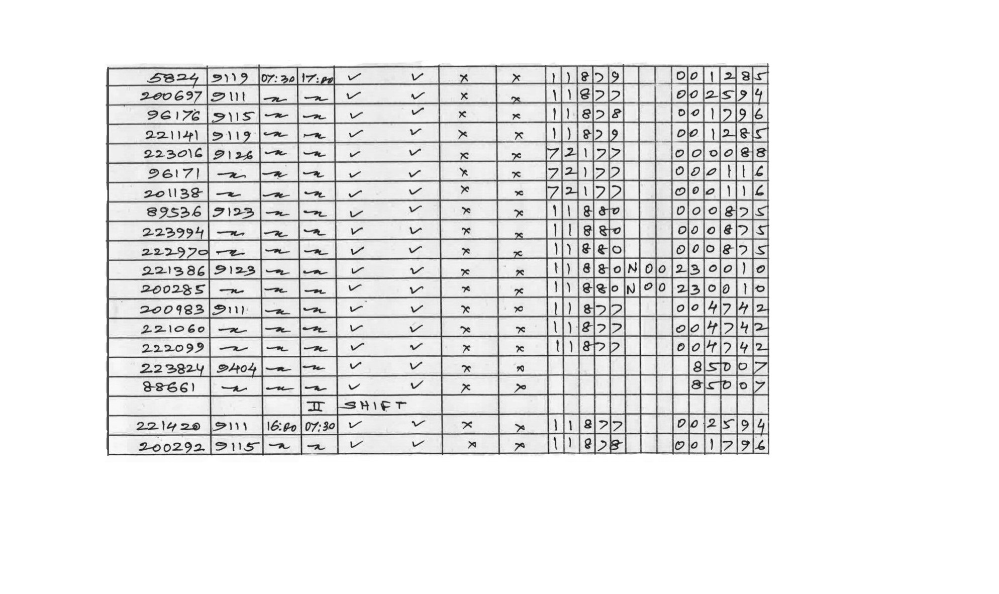

In [ ]:
cv2_imshow(img)

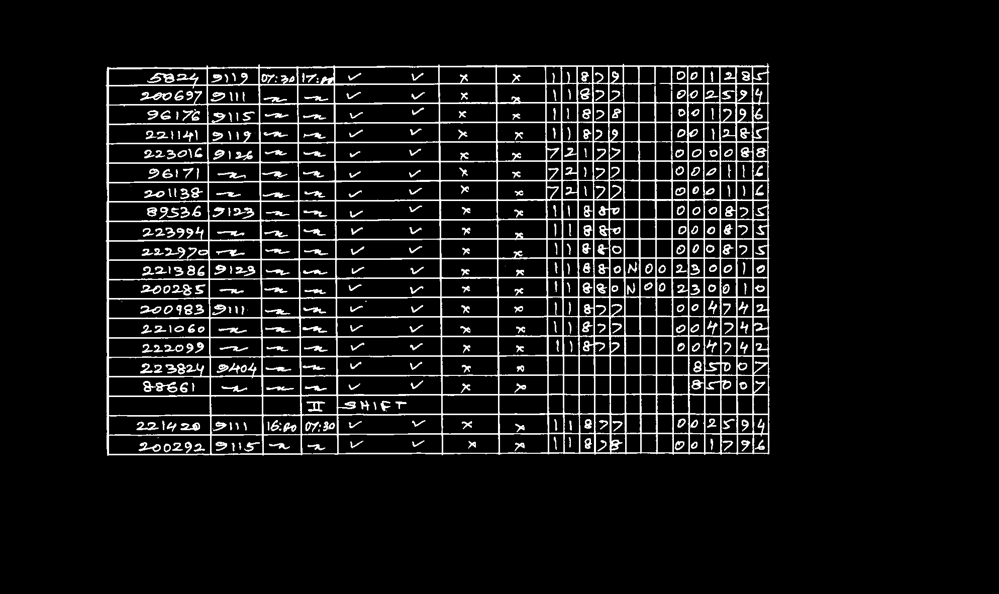

In [ ]:

(thresh, img_bin) = cv2.threshold(img,128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
img_bin = 255-img_bin
cv2_imshow(img_bin)

In [ ]:
kernel_length = np.array(img).shape[1]//80
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_length))

horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_length, 1))
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))



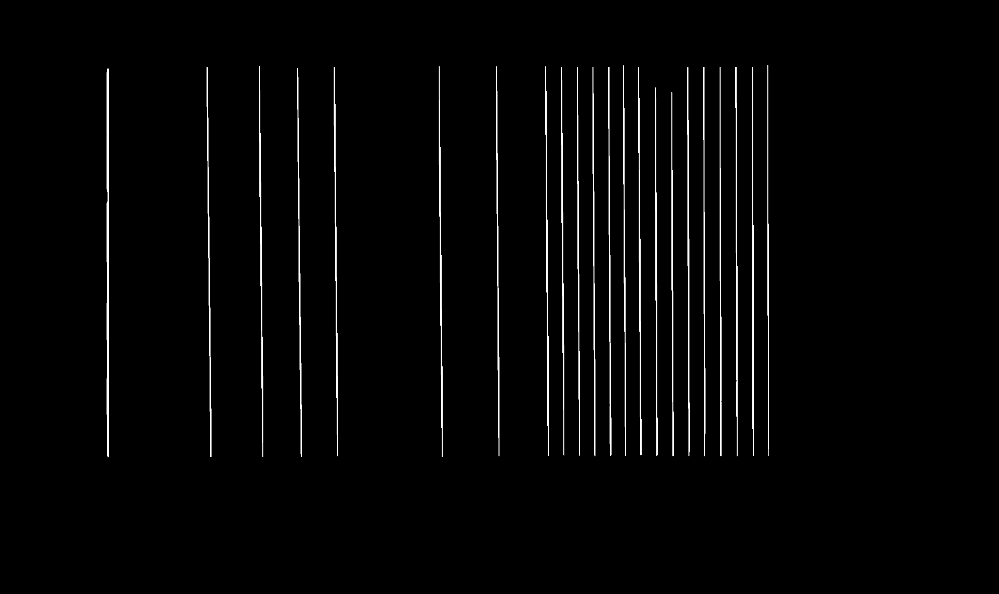

In [ ]:

vert_struct = cv2.erode(img_bin, vertical_kernel, iterations=3)
vert_img = cv2.dilate(vert_struct, vertical_kernel, iterations=3)
cv2_imshow(vert_img)

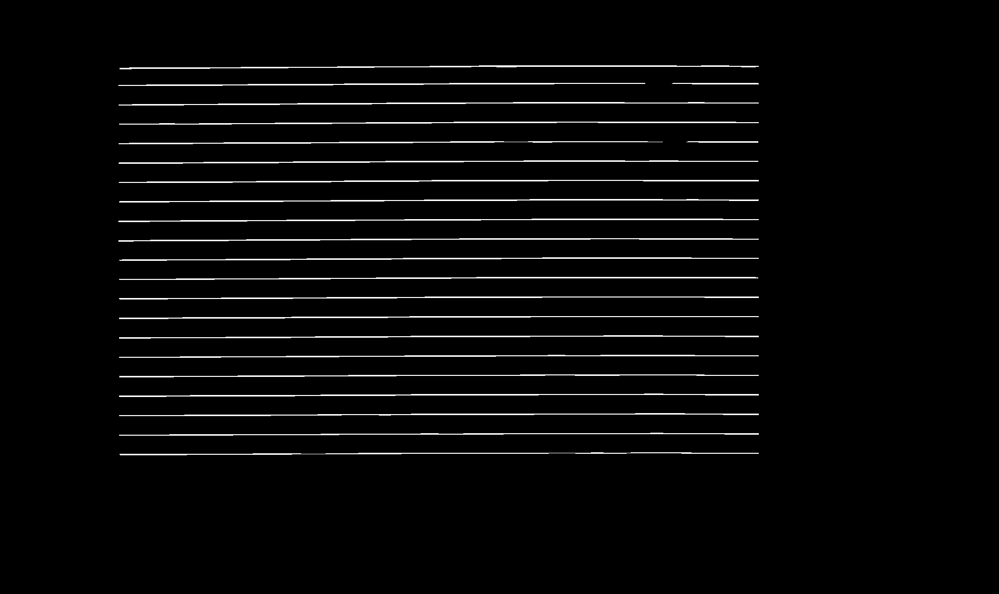

In [ ]:
horiz_struct = cv2.erode(img_bin, horizontal_kernel, iterations=3)
horiz_img = cv2.dilate(horiz_struct, horizontal_kernel, iterations=1)
cv2_imshow(horiz_img)

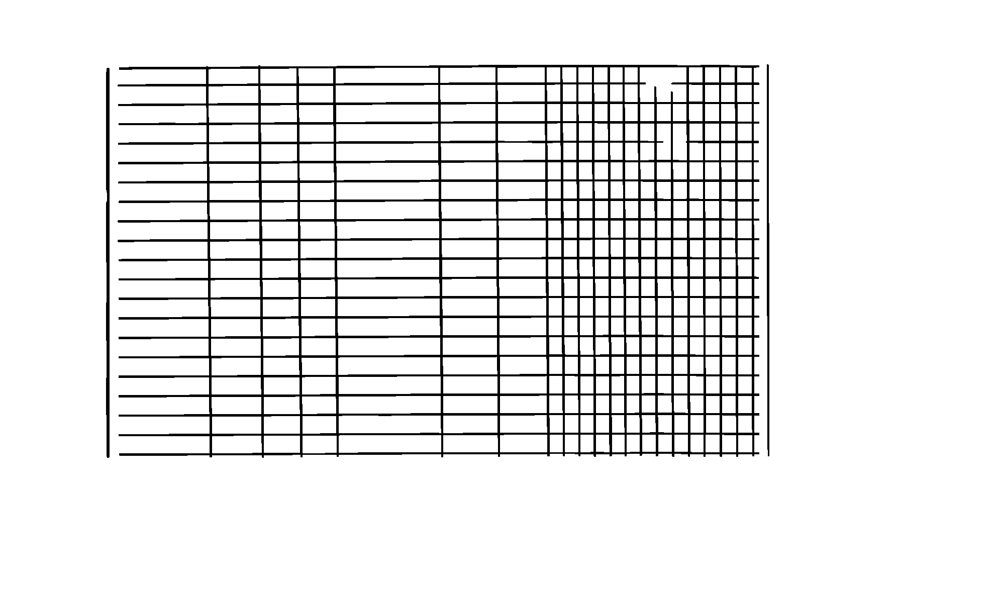

In [ ]:
alpha = 0.5
beta = 1.0 - alpha

combined_image = cv2.addWeighted(vert_img, alpha, horiz_img, beta, 0.0)
combined_image = cv2.erode(~combined_image, kernel, iterations=1)
(thresh,combined_image) = cv2.threshold(combined_image, 128,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
cv2_imshow(combined_image)

In [ ]:
from imutils import contours

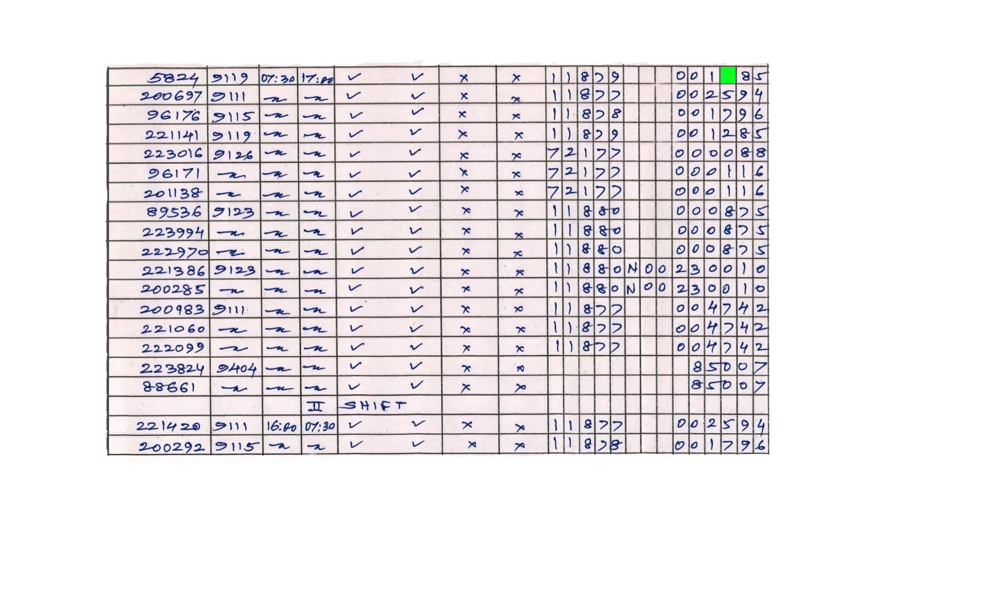

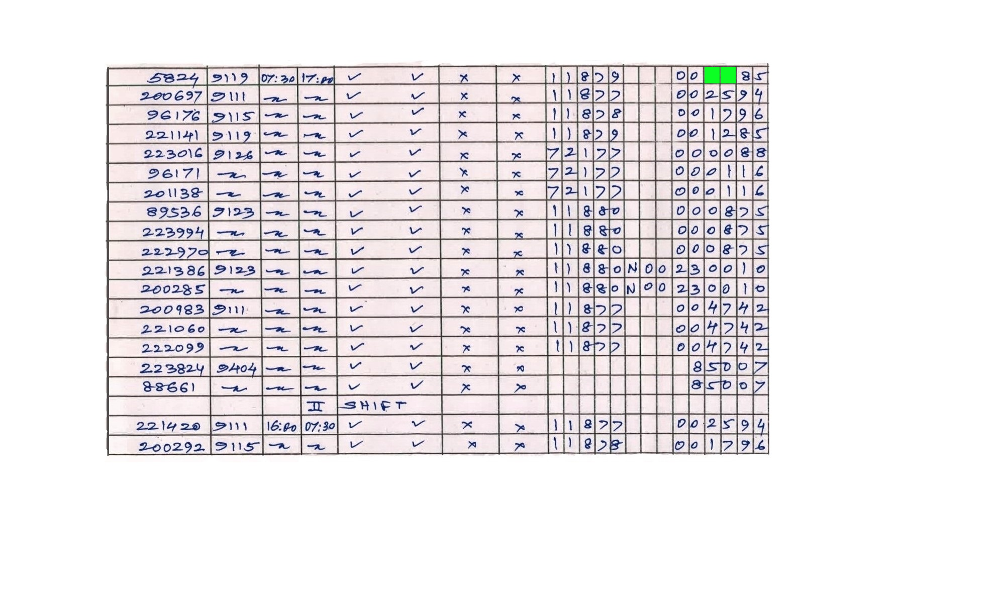

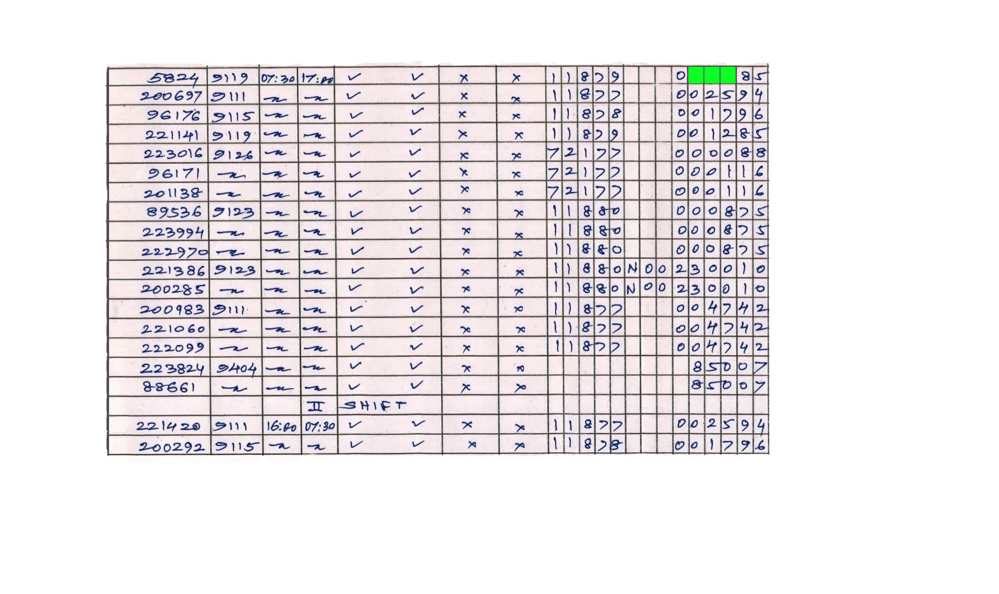

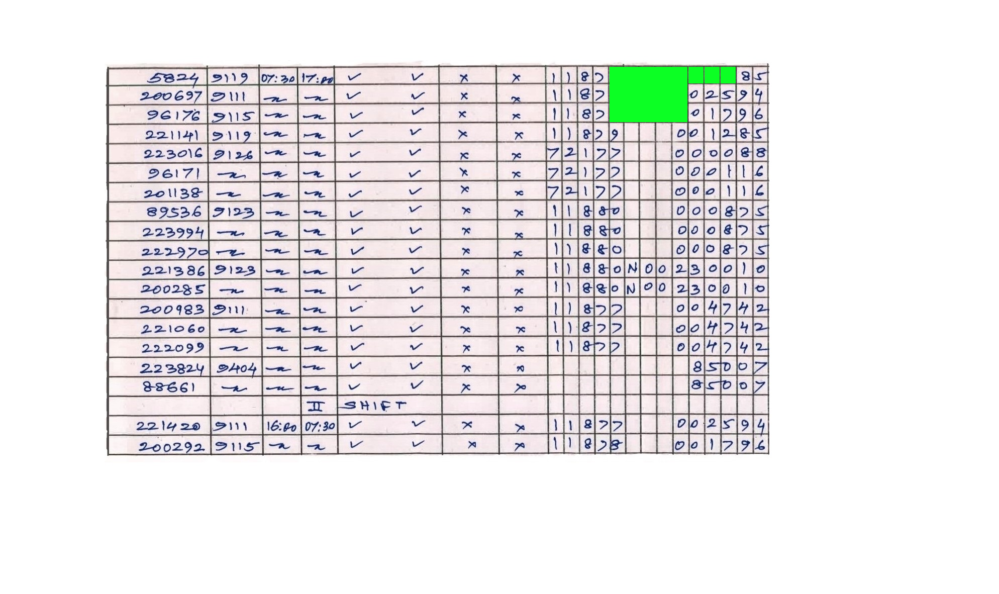

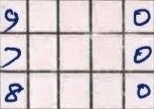

...

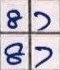

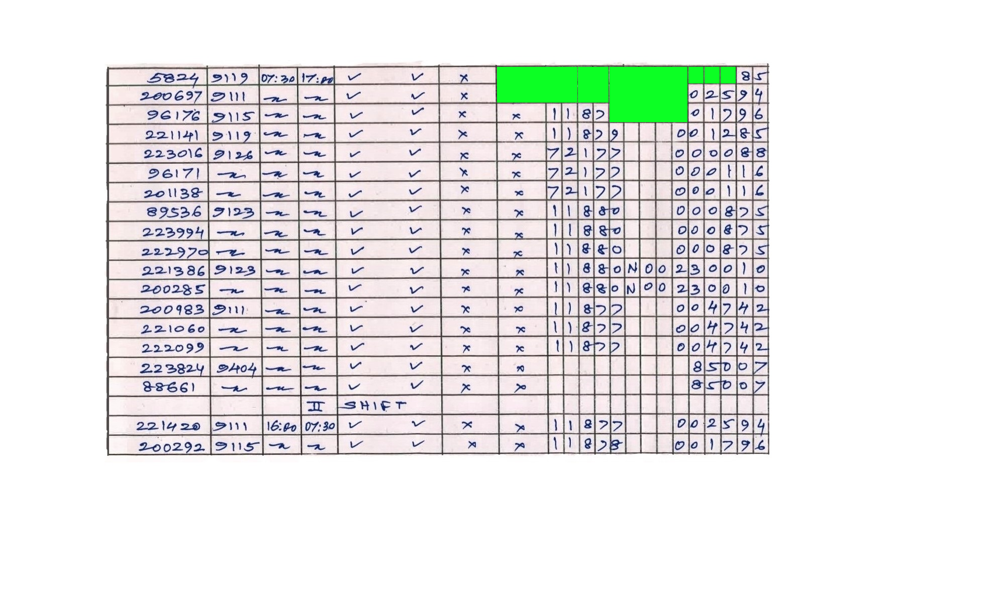

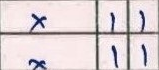

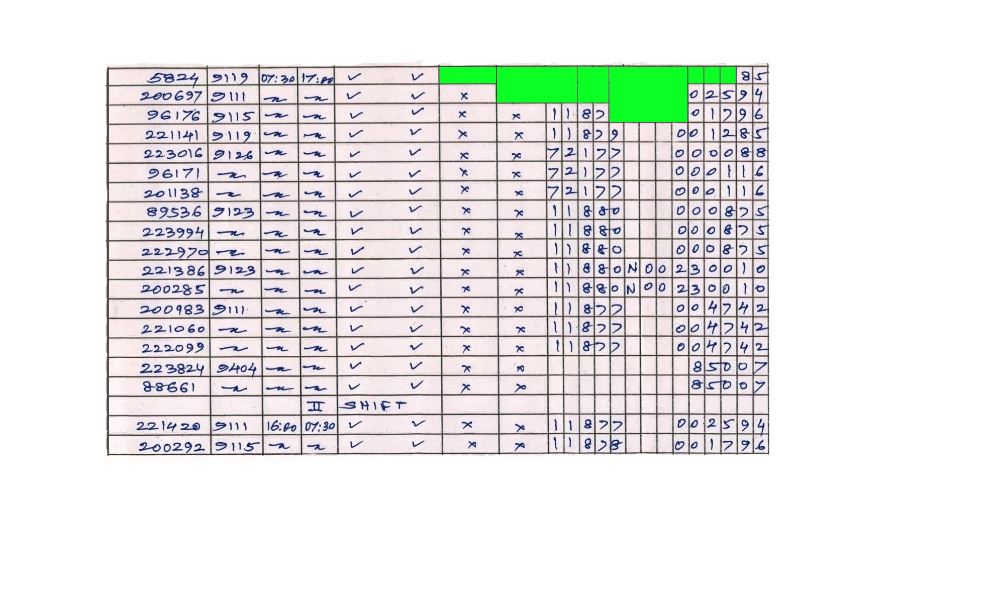

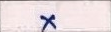

In [ ]:
image = cv2.imread('mazdoc.jpg')
original = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Remove text characters with morph open and contour filtering
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
cnts = cv2.findContours(opening, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 500:
        cv2.drawContours(opening, [c], -1, (0,0,0), -1)

# Repair table lines, sort contours, and extract ROI
close = 255 - cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=1)
cnts = cv2.findContours(close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
(cnts, _) = contours.sort_contours(cnts, method="top-to-bottom")
for c in cnts:
    area = cv2.contourArea(c)
    if area < 25000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), -1)
        ROI = original[y:y+h, x:x+w]

                # Visualization
        cv2_imshow(image)
        cv2_imshow( ROI)
     

cv2_imshow( opening)
cv2_imshow( close)
cv2_imshow( image)
